### Package imports

In [1]:
# Display plots inline and change default figure size
%matplotlib inline

# Package imports
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.finance import candlestick_ohlc
import csv

### Parameter Initialization [Please clarify using 20-days-segmentation or original-segmentation]

In [2]:
# Set the data source
#FILE_NAME = 'hk_price.txt'
FILE_NAME = 'hk_price_100k.txt'

# Check how many lines in the file
DATA_ROWS_NUM = 100000

# Catch the first several segments
MAX_SEG_TO_CATCH = 340

# How many days per segment
MAX_DAY_PER_SEG = 25

# Consider OPEN price or not
ADD_OPEN_PRICE = False

'''Decide to use segmation method 1 or method 2'''
USE_20_DAYS_SEG = True

### Data Initialization

In [3]:
# Init the array
X = [dict() for x in range(DATA_ROWS_NUM)]

### File Loading

In [4]:
# Load the data file (6s)
with open(FILE_NAME) as csvfile:
    reader = csv.DictReader(csvfile, delimiter = '\t')
    for ind, row in enumerate(reader):
        print(row)
        X[ind] = row

{'dat': '1996-09-27', 'close': '16.29', 'split': '1.0', 'vol': '25401312.00', 'tick': '000001', 'low': '15.80', 'open': '15.80', 'high': '16.50'}
{'dat': '1996-09-26', 'close': '15.68', 'split': '1.0', 'vol': '19122134.00', 'tick': '000001', 'low': '15.18', 'open': '15.20', 'high': '15.80'}
{'dat': '1996-09-25', 'close': '15.18', 'split': '1.0', 'vol': '10638929.00', 'tick': '000001', 'low': '14.90', 'open': '15.20', 'high': '15.63'}
{'dat': '1996-09-24', 'close': '15.08', 'split': '1.0', 'vol': '7686059.00', 'tick': '000001', 'low': '14.90', 'open': '14.90', 'high': '15.17'}
{'dat': '1996-09-23', 'close': '14.85', 'split': '1.0', 'vol': '10184478.00', 'tick': '000001', 'low': '14.10', 'open': '14.71', 'high': '15.20'}
{'dat': '1996-09-20', 'close': '14.65', 'split': '1.0', 'vol': '8010216.00', 'tick': '000001', 'low': '14.05', 'open': '14.05', 'high': '14.69'}
{'dat': '1996-09-19', 'close': '14.00', 'split': '1.0', 'vol': '7773622.00', 'tick': '000001', 'low': '13.86', 'open': '14.00'

### Segmentation (method 1): Crop each time segment by given year defferences

In [5]:
if(not USE_20_DAYS_SEG):
    '''Parameter Initialization'''
    # The first year of the data
    preYear = '1996'
    # Check how many segments have cropped so far
    i = 0

    # Create a limited number of lists of nested lists. The inner lists contain all datarow from a segment
    X_seg = [[] for x in range(MAX_SEG_TO_CATCH)]

    for row in X:
        curYear = row['dat'].split('-')[0]

        # Create a new segment if it comes a new year
        if(curYear != preYear):
            preYear = curYear
            i = i + 1

        # Stop creating segments if exceeding maximum
        if(i >= MAX_SEG_TO_CATCH):
            break

        # Append row to its segment
        X_seg[i].append(row)

### Segmentation (method 2): Crop the segment by given date frame, e.g. 20 days

In [6]:
if(USE_20_DAYS_SEG):
    '''Parameter Initialization'''
    # The first year of the data
    preYear = '1996'
    # Check how many segments have cropped so far
    i = 0
    data_count_per_seg = 0

    # Create a limited number of lists of nested lists. The inner lists contain all datarow from a segment
    X_seg = [[] for x in range(MAX_SEG_TO_CATCH)]

    for row in X:
        curYear = row['dat'].split('-')[0]

        # Create a new segment if it comes a new year
        if(curYear != preYear):
            preYear = curYear
            data_count_per_seg = 0
            i = i + 1

        # Create a new segment if a segment is fully filled
        elif(data_count_per_seg >= MAX_DAY_PER_SEG):
            data_count_per_seg = 0
            i = i + 1

        # Stop creating segments if exceeding maximum
        if(i >= MAX_SEG_TO_CATCH):
            break



        # Append row to its segment
        X_seg[i].append(row)
        data_count_per_seg = data_count_per_seg + 1

### Figure plotting

In [7]:
def findMaxInSegment(seg):
    max_price = 0
    max_ind = 0
    for ind, row in enumerate(seg):
        if (float(row['close']) > max_price):
            max_price = float(row['close'])
            max_ind = ind
    return (max_ind, max_price)

In [8]:
def getSlope(x1, y1, x2, y2, isABS):
    if (x2 - x1) != 0:
        slope = (y2 - y1)/(x2 - x1)
        if (slope > 0) or (not isABS):
            return slope
        else:
            return slope * (-1)
    else:
        raise ValueError('Zero Division')

In [9]:
def findUpperBoundGivenSegment(seg, max_ind, max_price):

    min_slope = 1
    # The second point who underpin the upper bound
    sec_ind = 0
    sec_price = 0
    
    for ind, row in enumerate(seg):
        price = float(row['close'])
        # Different from the max point
        if(ind != max_ind):
            ABSslope = getSlope(max_ind, max_price, ind, price, True)
            # Flatter slope found!!
            if(min_slope > ABSslope):
                sec_ind = ind
                sec_price = price
                min_slope = ABSslope
                
    return (sec_ind, sec_price)

In [10]:
def findLineViaTwoPoints(x1,y1,x2,y2):
    slope = getSlope(x1,y1,x2,y2, False)
    y0 = y1 - x1 * slope
    y3 = (19 - x1) * slope + y1
    return ([0,19], [y0,y3])

In [11]:
def plotBySegment(seg, ind):
    y = []
    length = len(seg)
    if(length > 0):
        date = seg[length-1]['dat'] + " to " + seg[0]['dat']
    else:
        date = "NA"
    
    # for each data, records its open price and close price
    for row in seg:
        if ADD_OPEN_PRICE:
            y.append(row['open'])
        y.append(row['close'])
        

    
    (max_ind, max_price) = findMaxInSegment(seg)
    (sec_ind, sec_price) = findUpperBoundGivenSegment(seg, max_ind, max_price)
    
    (line_x, line_y) = findLineViaTwoPoints(max_ind,max_price,sec_ind,sec_price)
    
    # Plot the figure for each segment
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_title("#" + str(ind) + " | " + date + " | num of data: " + str(length))
    ax.plot(y)
    if(USE_20_DAYS_SEG):
        ax.plot(line_x, line_y)

In [12]:
def plotCandleBySegment(seg, ind):
    y = []
    length = len(seg)
    if(length > 0):
        date = seg[length-1]['dat'] + " to " + seg[0]['dat']
    else:
        date = "NA"
    
    # for each data, records its open price and close price
    for i, row in enumerate(seg): # (close, high, low, open)
        y.append((i, float(row['open']), float(row['high']), float(row['low']), float(row['close'])))

    
    # Plot the figure for each segment
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_title("#" + str(ind) + " | " + date + " | num of data: " + str(length))
    #ax.plot(y)
    candlestick_ohlc(ax, y, width=0.6)
    plt.show()


### Figure Printing

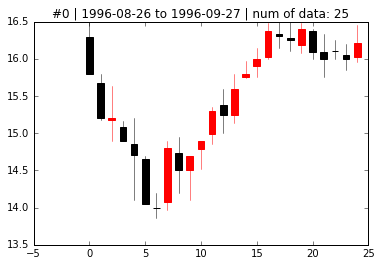

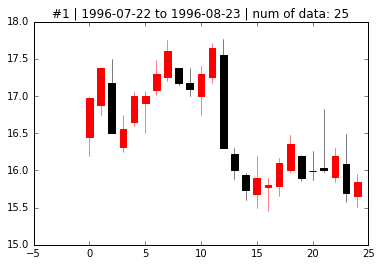

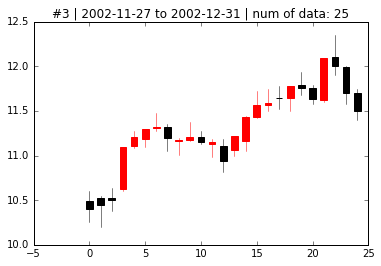

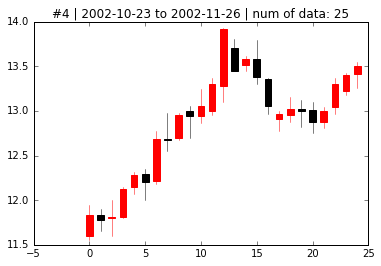

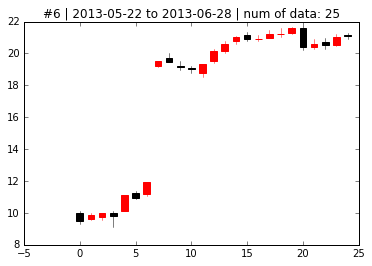

...

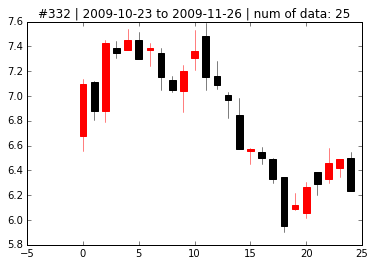

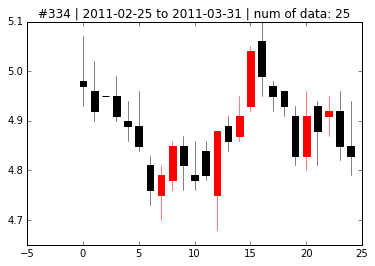

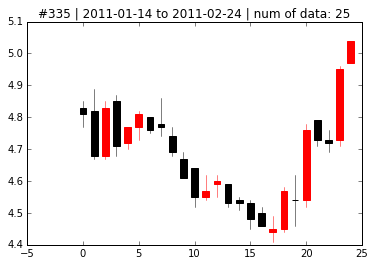

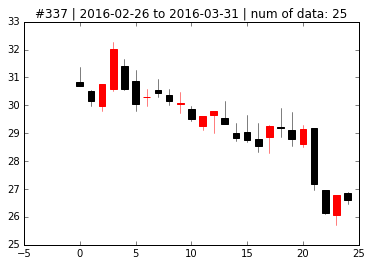

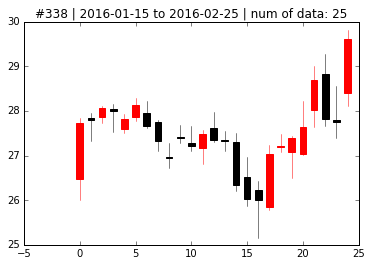

In [13]:
'''Print out the figures by 25-day'''
if(USE_20_DAYS_SEG):
    for ind, seg in enumerate(X_seg):
        if(len(seg) == MAX_DAY_PER_SEG):
            #plotBySegment(seg, ind)
            plotCandleBySegment(seg, ind)

In [14]:
'''Print out the figures by the original length'''
if(not USE_20_DAYS_SEG):
    for ind, seg in enumerate(X_seg):
        #plotBySegment(seg, ind)
        plotCandleBySegment(seg, ind)

### Collect valid data

In [13]:
# Read in labels from external file
with open('label.txt') as f:
    labels = f.readlines()
    
labels = [c.strip() for c in labels]  # Remove whitespace characters like `\n` at the end of each line
print(labels)

['3', '4', '16', '18', '25', '27', '31', '42', '43', '48', '51', '54', '63', '70', '72', '82', '88', '93', '96', '108', '113', '123', '126', '129', '132', '134', '147', '182', '214', '239', '242', '244', '271', '277', '280', '301', '313', '314', '319', '328', '']


In [14]:
# Create valid data matrix
X_seg_valid = []

In [22]:
# Assign label to designated row
id = 0

if(USE_20_DAYS_SEG):
    for ind, seg in enumerate(X_seg):
        if(len(seg) == MAX_DAY_PER_SEG):
            
            # Set the label of each day_dict
            label = 0    
            if(str(ind) in labels):
                label = 1
            
            for index, day_dict in enumerate(seg):
                seg[index]["label"] = label
                seg[index]["id"] = id
            
            X_seg_valid.append(seg)
            
            id += 1

In [28]:
'''Situation...should how should I construct the array?'''
print(len(X_seg_valid))

1135


In [25]:
with open('output.csv', 'w') as csvfile:
    fieldnames = ['id', 'dat', 'open', 'close', 'high', 'low', 'label']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

    writer.writeheader()
    # writer.writerow({'first_name': 'Baked', 'last_name': 'Beans'})
    for ind, seg in enumerate(X_seg_valid):
        for index, day_dict in enumerate(seg):
            writer.writerow({'id': seg[index]['id'], 'dat': seg[index]['dat'], 'open': seg[index]['open'], 'close': seg[index]['close'], 'high': seg[index]['high'], 'low': seg[index]['low'], 'label': seg[index]['label']})